In [1]:
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from sklearn import preprocessing

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_2863/3864859789.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
#import dataset
df = pd.read_csv('../dataset/WA_Fn-UseC_-Telco-Customer-Churn.csv')

In [3]:
#show columns
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

Demoraphic Variables
| Variable       | Description                               | Data Type          |
|----------------|-------------------------------------------|--------------------|
| customerID     | Unique customer identifier                | object (string)    |
| gender         | Gender of the customer                    | object (categorical) |
| SeniorCitizen  | Whether the customer is a senior (1 = Yes)| int64 (binary)     |
| Partner        | Whether the customer has a partner        | object (Yes/No)    |
| Dependents     | Whether the customer has dependents       | object (Yes/No)    |


Contract Information
| Variable         | Description                                 | Data Type         |
|------------------|---------------------------------------------|-------------------|
| tenure           | Number of months the customer has stayed    | int64             |
| Contract         | Type of contract                            | object (categorical) |
| PaperlessBilling | Whether the customer has paperless billing  | object (Yes/No)   |
| PaymentMethod    | Payment method                              | object (categorical) |


Service Subscription
| Variable          | Description                                     | Data Type          |
|-------------------|-------------------------------------------------|--------------------|
| PhoneService      | Whether the customer has phone service          | object (Yes/No)    |
| MultipleLines     | Whether the customer has multiple phone lines   | object (Yes/No/No phone service) |
| InternetService   | Type of internet service                        | object (DSL/Fiber optic/No) |
| OnlineSecurity    | Whether the customer has online security        | object (Yes/No/No internet service) |
| OnlineBackup      | Whether the customer has online backup          | object (Yes/No/No internet service) |
| DeviceProtection  | Whether the customer has device protection      | object (Yes/No/No internet service) |
| TechSupport       | Whether the customer has technical support      | object (Yes/No/No internet service) |
| StreamingTV       | Whether the customer has streaming TV           | object (Yes/No/No internet service) |
| StreamingMovies   | Whether the customer has streaming movies       | object (Yes/No/No internet service) |


Financial Variables
| Variable        | Description                                | Data Type       |
|-----------------|--------------------------------------------|-----------------|
| MonthlyCharges  | The amount charged to the customer monthly | float64         |
| TotalCharges    | The total amount charged to the customer   | object  |

Target Variable
| Variable | Description                      | Data Type       |
|----------|----------------------------------|-----------------|
| Churn    | Whether the customer has churned | object (Yes/No) |

In [4]:
#describe statistics of numerical feautres
df.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [5]:
#set the index to customerID
df.set_index('customerID', inplace=True)

In [6]:
#show info about the dataset (specifically the data types)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null 

Strange that TotalCharges is object and not numeric

In [7]:
#convert TotalCharges to numeric
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')

## Missing values

In [8]:
df.isnull().sum()

gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [9]:
# show the rows with null values
df[df['TotalCharges'].isnull()]

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No


In [10]:
# only 11 out of 7043 rows have null values in TotalCharges, so let's drop them
df.dropna(subset=['TotalCharges'], inplace=True)
df['TotalCharges'].isnull().sum()

0

Let's check more deeply if there other missing values (or values outside the defined range)

In [12]:
# define possible values for each feature

possible_values = {
    "gender": ["Female","Male"],
    "SeniorCitizen": [0, 1],
    "Partner": ["No", "Yes"],
    "Dependents": ["No", "Yes"],
    "tenure": [i for i in range(0, 74)],
    "PhoneService": ["No", "Yes"],
    "MultipleLines": ["No phone service", "No", "Yes"],
    "InternetService": ["DSL", "Fiber optic", "No"],
    "OnlineSecurity": ["No", "Yes", "No internet service"],
    "OnlineBackup": ["No", "Yes", "No internet service"],
    "DeviceProtection": ["No", "Yes", "No internet service"],
    "TechSupport": ["No", "Yes", "No internet service"],
    "StreamingTV": ["No", "Yes", "No internet service"],
    "StreamingMovies": ["No", "Yes", "No internet service"],
    "Contract": ["Month-to-month", "One year", "Two year"],
    "PaperlessBilling": ["No", "Yes"],
    "PaymentMethod": ["Electronic check", "Mailed check", "Bank transfer (automatic)", "Credit card (automatic)"],
    "Churn": ["No", "Yes"],
}
# monthly charges and total charges are continuous variables, so we will not define possible values for them

In [13]:
# check if all values are in the possible values
def check_values(df, possible_values):
    for column in df.columns:
        if column in possible_values:
            values = df[column].unique()
            if not set(values).issubset(set(possible_values[column])):
                print(f"Column {column} has values {values} that are not in {possible_values[column]}")
    print("End of check")
check_values(df, possible_values)

End of check


All values in range for the defined categories. 

Check for duplicates

In [14]:
# check for duplicates
df.duplicated().sum()

22

In [15]:
# drop duplicates
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

## Dataset Transformation

Lots of categorical variables should be binary variables. I define a routine to convert them to boolean type. I also decided to transform the variables 'PhoneService', 'MultipleLines', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', to binary variables transforming the No Internet/phone service to False. 

Finally, also the gender variable is transformed in a binary variable 'IsMale', which is True if gender is Male, False otherwise

In [16]:
# make binary values boolean values
def make_binary_values(df, possible_values):
    for column in df.columns:
        if column in possible_values:
            if set(possible_values[column]) == {0, 1}:
                df[column] = df[column].astype(bool)
            elif set(possible_values[column]) == {"No", "Yes"}:
                df[column] = df[column].map({"No": False, "Yes": True})
            elif set(possible_values[column]) == {"Female", "Male"}:
                df[column] = df[column].map({"Female": False, "Male": True})
            # if set of possible include Yes, No and some other value then transform to boolean and replace the other value with NaN
            elif set(possible_values[column]) == {"No", "Yes", "No internet service"}:
                df[column] = df[column].map({"No": False, "Yes": True, "No internet service": False})
            elif set(possible_values[column]) == {"No", "Yes", "No phone service"}:
                df[column] = df[column].map({"No": False, "Yes": True, "No phone service": False})

                
    return df

In [17]:
df_new = df.copy()
df_new = make_binary_values(df_new, possible_values)

In [18]:
# rename gender column with IsMale
df_new['IsMale'] = df_new['gender']
df_new.drop(['gender'], axis=1, inplace=True)


In [19]:
df_new.info()


<class 'pandas.core.frame.DataFrame'>
Index: 7010 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SeniorCitizen     7010 non-null   bool   
 1   Partner           7010 non-null   bool   
 2   Dependents        7010 non-null   bool   
 3   tenure            7010 non-null   int64  
 4   PhoneService      7010 non-null   bool   
 5   MultipleLines     7010 non-null   bool   
 6   InternetService   7010 non-null   object 
 7   OnlineSecurity    7010 non-null   bool   
 8   OnlineBackup      7010 non-null   bool   
 9   DeviceProtection  7010 non-null   bool   
 10  TechSupport       7010 non-null   bool   
 11  StreamingTV       7010 non-null   bool   
 12  StreamingMovies   7010 non-null   bool   
 13  Contract          7010 non-null   object 
 14  PaperlessBilling  7010 non-null   bool   
 15  PaymentMethod     7010 non-null   object 
 16  MonthlyCharges    7010 non-null 

In [20]:
df_new.describe()

,tenure,MonthlyCharges,TotalCharges
count,7010.000000,7010.000000,7010.000000
mean,32.520399,64.888666,2290.353388
std,24.520441,30.064769,2266.820832
min,1.000000,18.250000,18.800000
25%,9.000000,35.750000,408.312500
50%,29.000000,70.400000,1403.875000
75%,56.000000,89.900000,3807.837500
max,72.000000,118.750000,8684.800000


Now we have 14 boolean variables, 3 numerical ones and 3 categorical. In detail:


In [21]:
# print the boolean variables, then the numerical variables and finally the categorical variables
def print_dataframe_info(df):
    print("Boolean variables:")
    print(df.select_dtypes(include=[bool]).columns)
    print("\nNumerical variables:")
    print(df.select_dtypes(include=[np.number]).columns)
    print("\nCategorical variables:")
    print(df.select_dtypes(include=[object]).columns)
print_dataframe_info(df_new)

Boolean variables:
Index(['SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'Churn', 'IsMale'],
      dtype='object')

Numerical variables:
Index(['tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

Categorical variables:
Index(['InternetService', 'Contract', 'PaymentMethod'], dtype='object')


Let's one-hot-encode the categorical variables

In [22]:
# one-hot encode the categorical features
def one_hot_encode(df, columns):
    for column in columns:
        dummies = pd.get_dummies(df[column], prefix=column)
        df = pd.concat([df, dummies], axis=1)
        df.drop(column, axis=1, inplace=True)
    return df
# one-hot encode the categorical features
categorical_features = ['Contract', 'PaymentMethod', 'InternetService']
df_new = one_hot_encode(df_new, categorical_features)


In [23]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7010 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   SeniorCitizen                            7010 non-null   bool   
 1   Partner                                  7010 non-null   bool   
 2   Dependents                               7010 non-null   bool   
 3   tenure                                   7010 non-null   int64  
 4   PhoneService                             7010 non-null   bool   
 5   MultipleLines                            7010 non-null   bool   
 6   OnlineSecurity                           7010 non-null   bool   
 7   OnlineBackup                             7010 non-null   bool   
 8   DeviceProtection                         7010 non-null   bool   
 9   TechSupport                              7010 non-null   bool   
 10  StreamingTV                           

## Distributions of variable

Let's see the distributions of all the variables based on the target variable (churned or not churned)

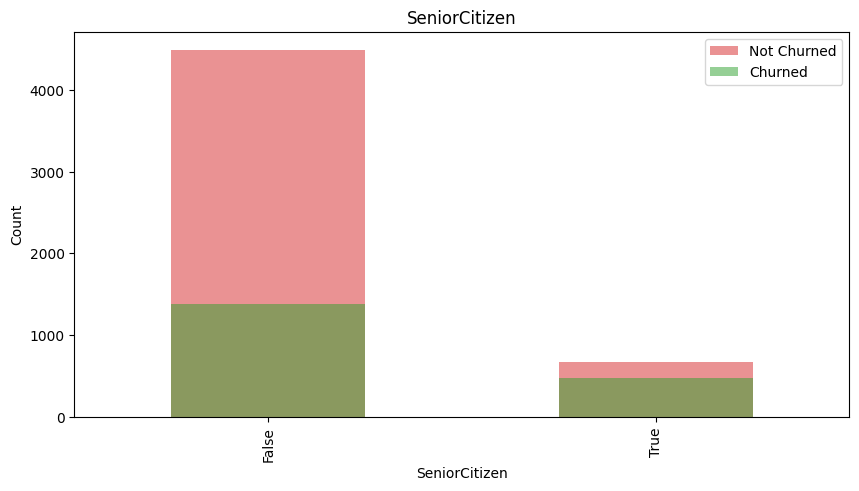

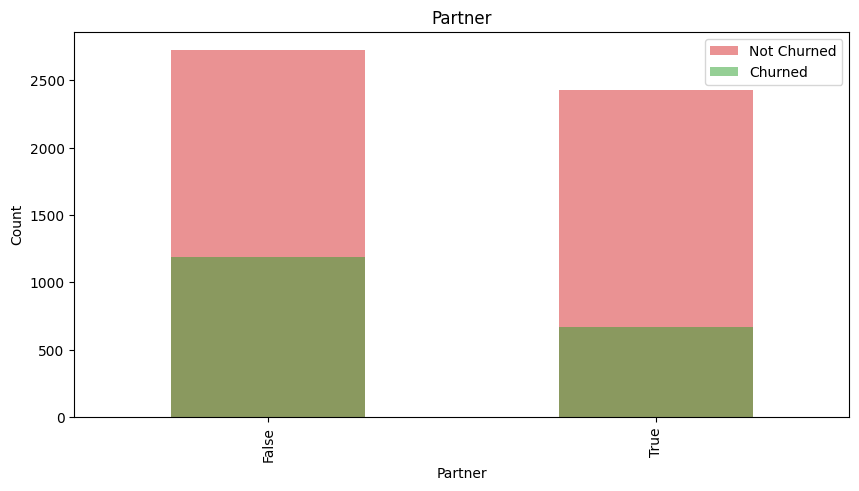

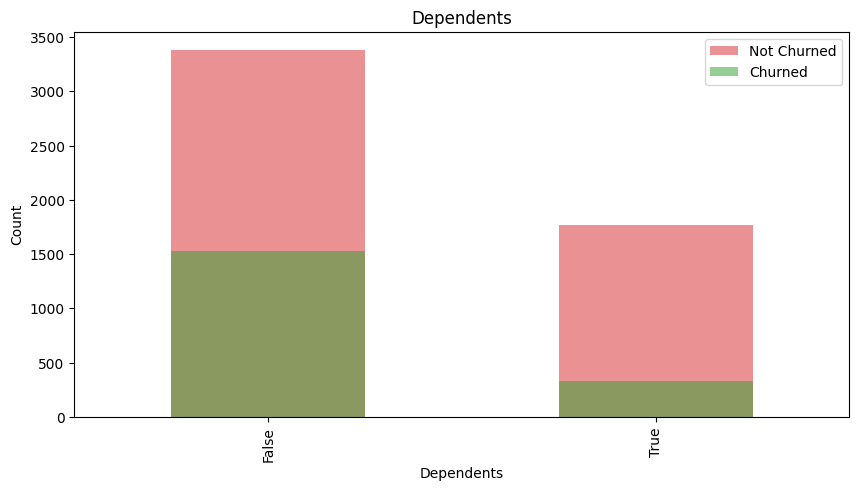

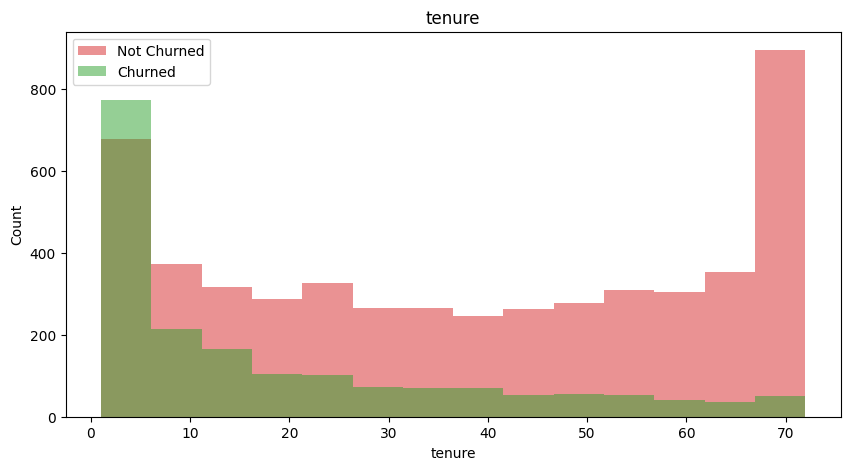

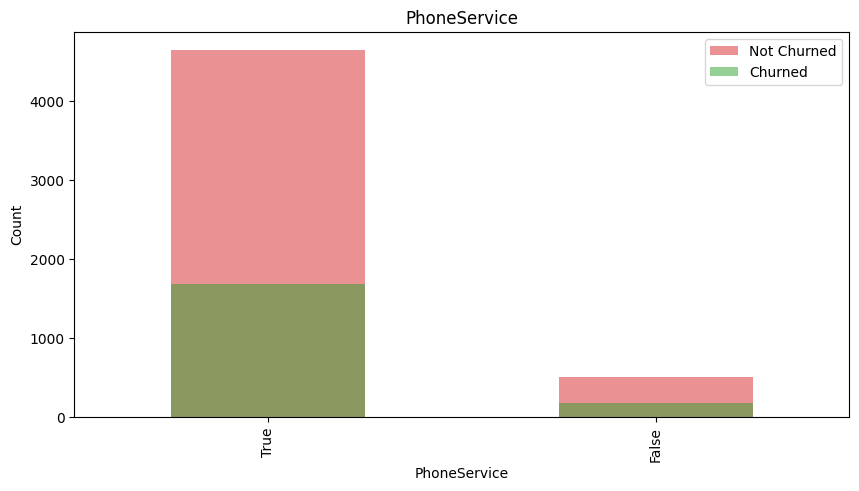

...

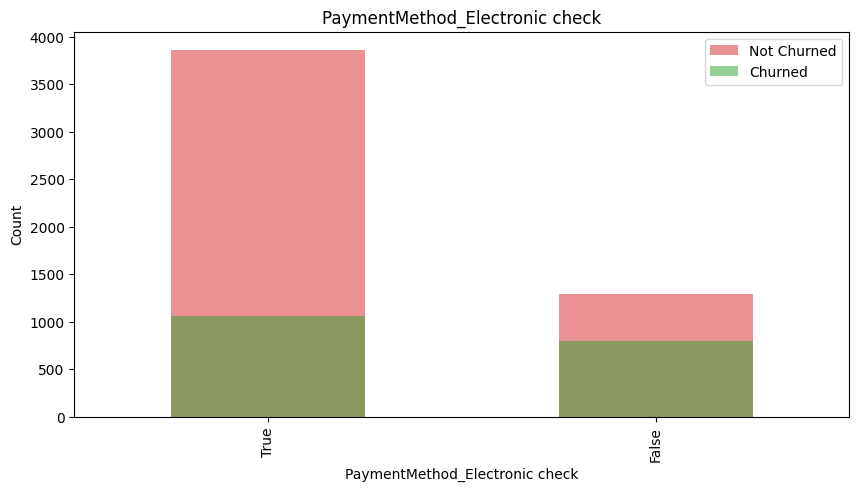

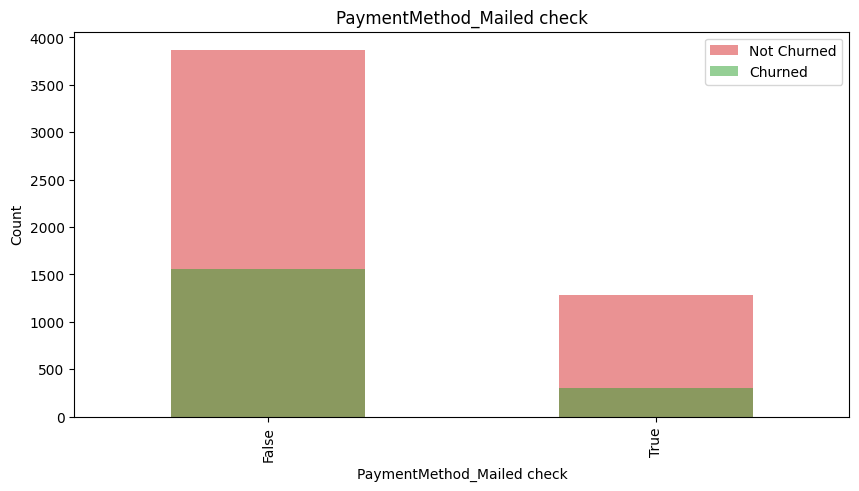

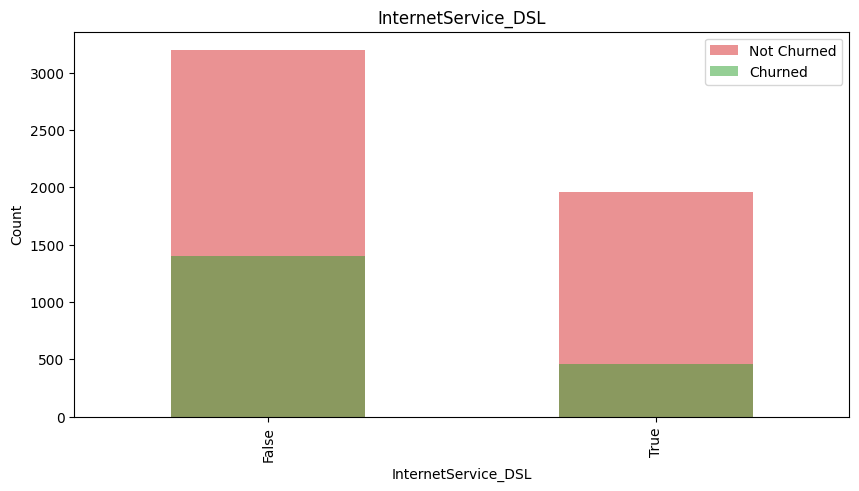

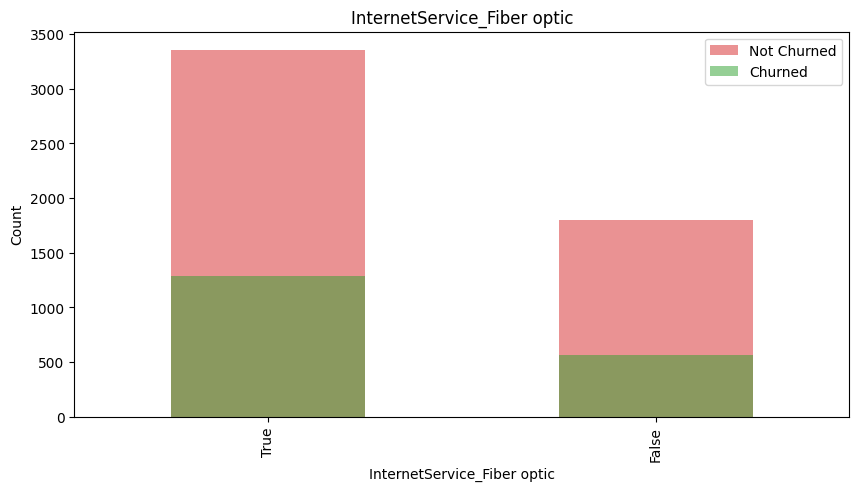

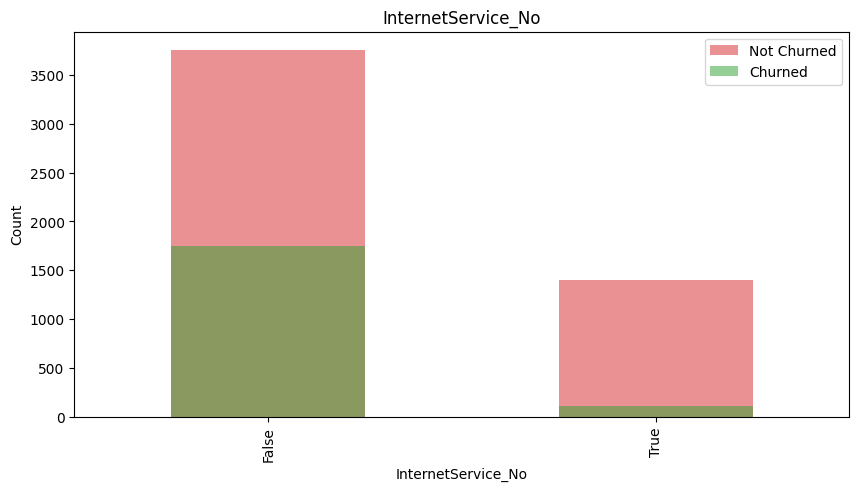

In [24]:
# churned customers
df_churned = df_new[df_new['Churn'] == True]
# not churned customers
df_not_churned = df_new[df_new['Churn'] == False]

#make histogram of all numerical features color coded by churn
def make_histogram(df_churn, df_not_churned, column):
    plt.figure(figsize=(10, 5))
    # same bins for both histograms
    bins = np.linspace(min(df_churn[column].min(), df_not_churned[column].min()),
                       max(df_churn[column].max(), df_not_churned[column].max()), 15)
    plt.hist(df_not_churned[column], bins=bins, color='tab:red', alpha=0.5, label='Not Churned')
    plt.hist(df_churn[column], bins=bins, color='tab:green', alpha=0.5, label='Churned')
    plt.title(column)
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend()
    plt.show()

#make bar plot of all categorical features color coded by churn
def make_bar_plot(df_churn, df_not_churned, column):
    plt.figure(figsize=(10, 5))
    df_not_churned[column].value_counts().plot(kind='bar', color='tab:red', alpha=0.5, label='Not Churned')
    df_churn[column].value_counts().plot(kind='bar', color='tab:green', alpha=0.5, label='Churned')
    plt.title(column)
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend()
    plt.show()
def make_plots(df_churn, df_not_churned):
    for column in df_churn.columns:
        #if column is numerical
        if df_churn[column].dtype in ['int64', 'float64']:
            make_histogram(df_churn, df_not_churned, column)
# make bar plots for all categorical features
        elif df_churn[column].dtype == 'object' and column != 'customerID':
            make_bar_plot(df_churn, df_not_churned, column)
        elif df_churn[column].dtype == 'bool' and column != 'Churn':
            make_bar_plot(df_churn, df_not_churned, column)
make_plots(df_churned, df_not_churned)

## Correlation studies

In [25]:
# create a new dataset where the numerical features are rescaled to the range [0, 1]
def rescale(df):
    df_rescaled = df.copy()
    for column in df.columns:
        if df[column].dtype in ['int64', 'float64']:
            min_value = df[column].min()
            max_value = df[column].max()
            df_rescaled[column] = (df[column] - min_value) / (max_value - min_value)
    return df_rescaled
df_rescaled = rescale(df_new)

In [26]:
corrmat = df_rescaled.corr()

In [27]:
mask = np.triu(np.ones_like(corrmat, dtype=bool))

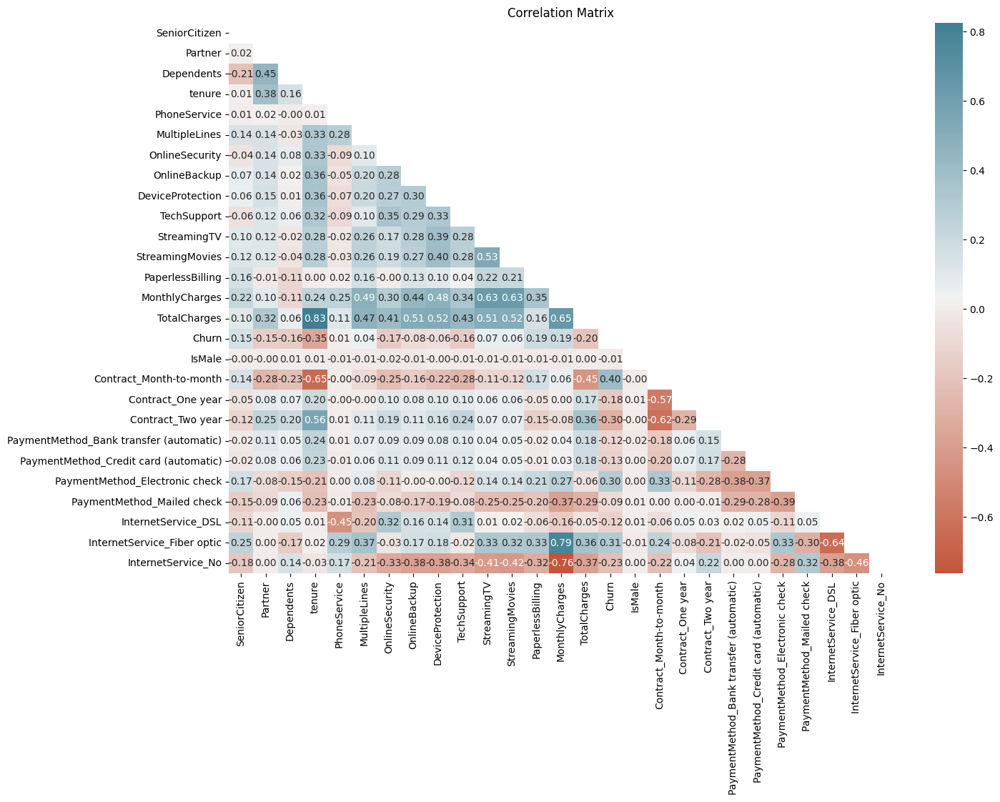

In [28]:
# make a heatmap of the correlation matrix

plt.figure(figsize=(15, 10))
sns.heatmap(df_rescaled.corr(), annot=True, cmap=sns.diverging_palette(20,220,as_cmap=True), fmt='.2f',mask=mask)
plt.title('Correlation Matrix')
plt.show()

In [29]:
# take all the elements in the matrix and order them by correlation. Then print the pairwise variables with the highest correlation
def get_top_correlations(df, n=10, order=False):
    corr = df.corr()
    corr = corr.unstack().sort_values(ascending=order)
    corr = corr[corr < 1]
    # keep only the even index (for removing the duplicates)
    corr = corr[::2]
    return corr.head(n)
# get the top 10 correlations
top_correlations = get_top_correlations(df_rescaled, n=10)
print(top_correlations)
# get the bottom 10 correlations
bottom_correlations = get_top_correlations(df_rescaled, n=10, order=True)
print(bottom_correlations)


tenure                       TotalCharges         0.825293
InternetService_Fiber optic  MonthlyCharges       0.787169
TotalCharges                 MonthlyCharges       0.650540
MonthlyCharges               StreamingTV          0.629336
                             StreamingMovies      0.626885
tenure                       Contract_Two year    0.563273
StreamingMovies              StreamingTV          0.532456
DeviceProtection             TotalCharges         0.521863
StreamingMovies              TotalCharges         0.518704
StreamingTV                  TotalCharges         0.514548
dtype: float64
InternetService_No           MonthlyCharges                -0.762181
tenure                       Contract_Month-to-month       -0.648215
InternetService_DSL          InternetService_Fiber optic   -0.643450
Contract_Two year            Contract_Month-to-month       -0.621445
Contract_Month-to-month      Contract_One year             -0.569560
InternetService_Fiber optic  InternetService_No   

In [30]:
# calculate the correlation between each feature and the target variable
correlation = df_new.corr()['Churn'].sort_values(ascending=False)
# print the correlation values
print(correlation)


Churn                                      1.000000
Contract_Month-to-month                    0.404346
InternetService_Fiber optic                0.307612
PaymentMethod_Electronic check             0.301079
MonthlyCharges                             0.194008
PaperlessBilling                           0.190518
SeniorCitizen                              0.151270
StreamingTV                                0.065058
StreamingMovies                            0.062670
MultipleLines                              0.041888
PhoneService                               0.011072
IsMale                                    -0.008694
DeviceProtection                          -0.064978
OnlineBackup                              -0.081145
PaymentMethod_Mailed check                -0.091649
PaymentMethod_Bank transfer (automatic)   -0.117442
InternetService_DSL                       -0.124152
PaymentMethod_Credit card (automatic)     -0.134052
Partner                                   -0.148670
Dependents  

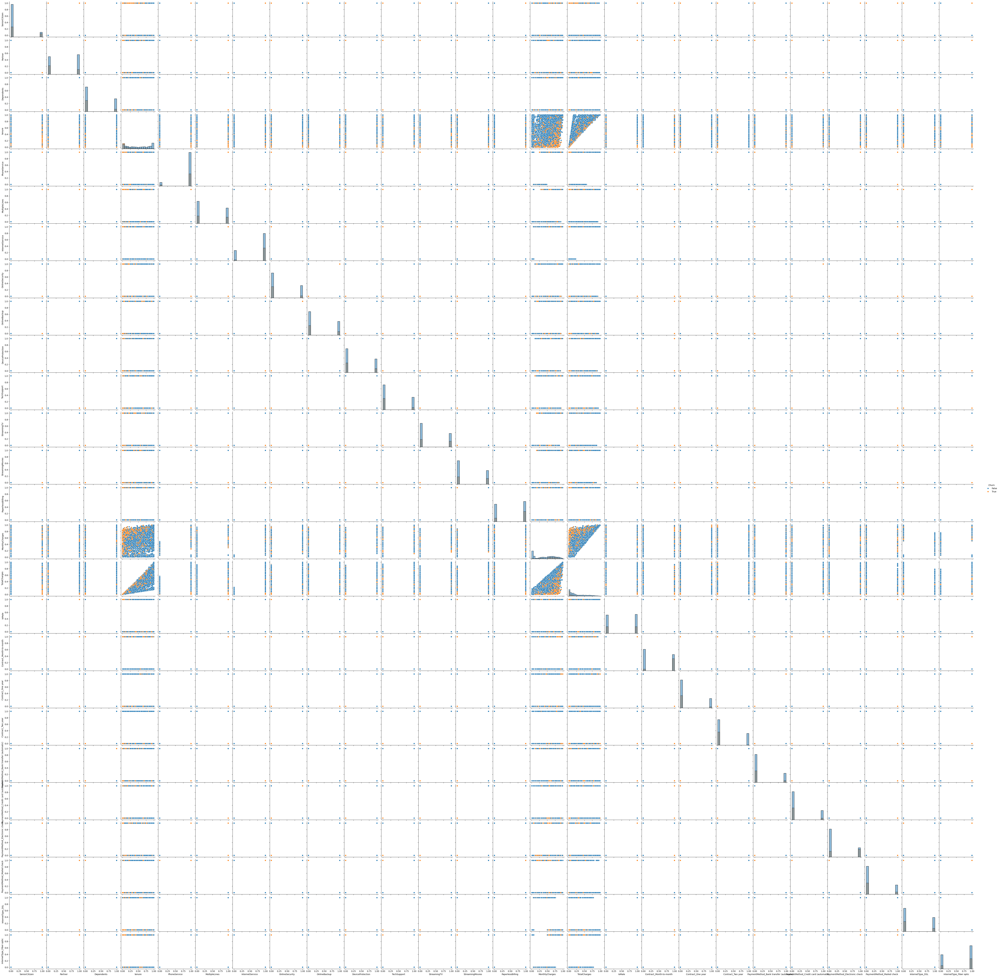

In [ ]:
sns.pairplot(df_rescaled, hue='Churn', diag_kind='hist')

## New Features

In [31]:
# scale the dataset with the standard scaler
scaler = preprocessing.StandardScaler()
X = df_new.drop(['Churn'], axis=1)
X = scaler.fit_transform(X)
y = df_new['Churn']

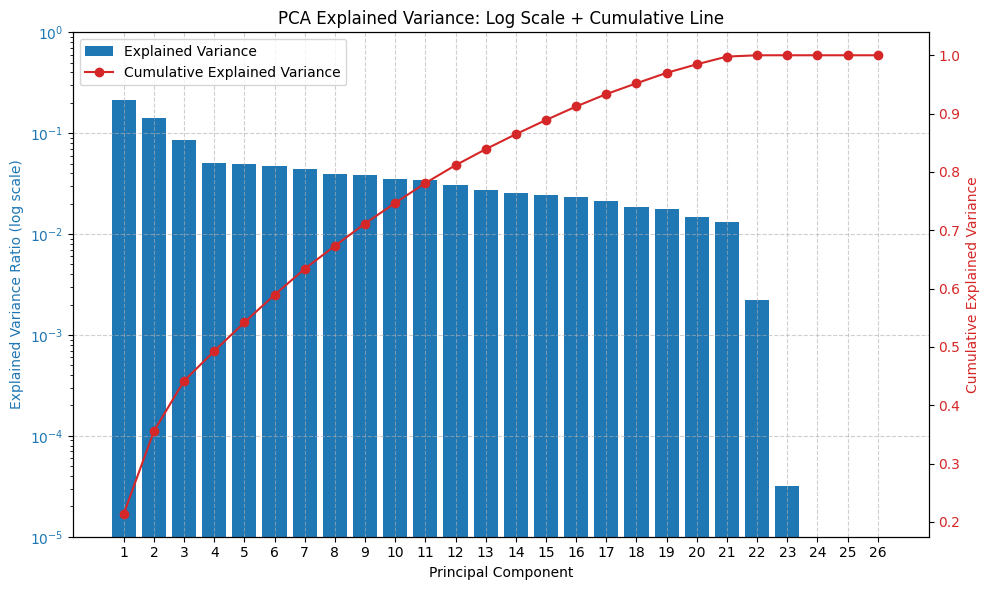

In [32]:
# PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Varianza spiegata
explained_var = pca.explained_variance_ratio_
cum_explained_var = np.cumsum(explained_var)
components = np.arange(1, len(explained_var) + 1)

# Creazione del plot con doppio asse y
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot su asse y sinistro (logaritmico)
ax1.bar(components, explained_var, color='tab:blue', alpha=1, label='Explained Variance')
ax1.set_yscale('log')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Explained Variance Ratio (log scale)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks(components)

# Secondo asse y per la varianza cumulativa (lineare)
ax2 = ax1.twinx()
ax2.plot(components, cum_explained_var, color='tab:red', marker='o', label='Cumulative Explained Variance')
ax2.set_ylabel('Cumulative Explained Variance', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Titolo e griglia
plt.title('PCA Explained Variance: Log Scale + Cumulative Line')
ax1.grid(True, linestyle='--', alpha=0.6)

#limiti sull'asse y sinistro a 10^-7
ax1.set_ylim(1e-5, 1)
# Legenda combinata
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc='best')


plt.tight_layout()
plt.show()

Last 4/5 variables are redunant (linear combinations of the others). One example may be totalcharges which is surely a combination of monthlycharge and tenure. 

In [33]:
# apply PCA with 21 components
pca = PCA(n_components=21)
X_pca = pca.fit_transform(X)

In [36]:
X_pca

array([[-1.96039423, -0.83211319,  3.05014351, ..., -0.17563343,
         0.01178383,  0.92596119],
       [-1.03244368,  1.6545662 ,  1.605137  , ..., -0.13772467,
         0.91604159, -0.3622301 ],
       [-1.93069266, -0.36189676,  2.26653862, ...,  0.03908353,
         0.10485632,  0.39673074],
       ...,
       [-1.86531843,  0.01793618,  3.01803312, ...,  0.02072697,
        -0.42624444,  0.15404535],
       [-1.24993891, -2.20511418, -1.07619623, ..., -0.14681212,
         0.81080697,  0.75097192],
       [ 3.76236032,  0.90289743, -0.37705833, ..., -0.00573396,
         0.04428551, -0.51376059]])

For the sake of visualisation, let's explore the first three PCs which are the most significant ones with respect to the others

In [34]:
unique_labels = df_new['Churn'].unique()
# Create a color map for the labels
colors = sns.color_palette("colorblind", len(unique_labels))

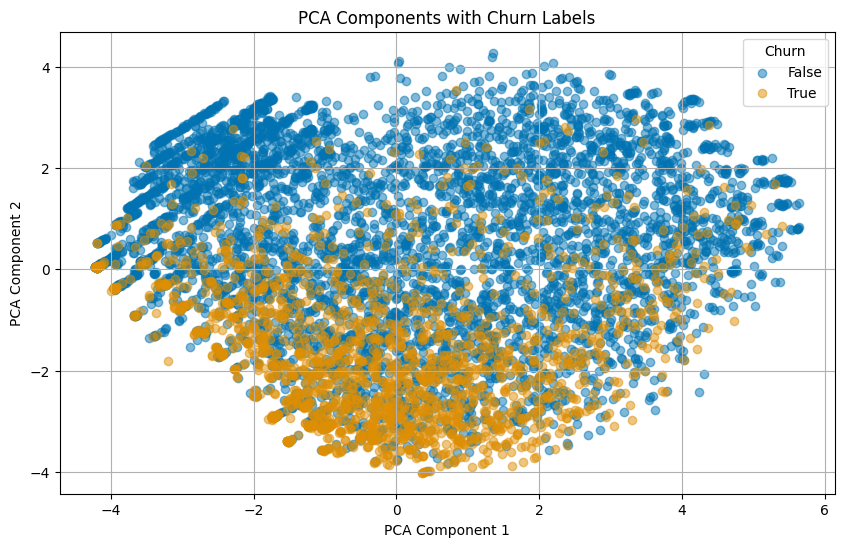

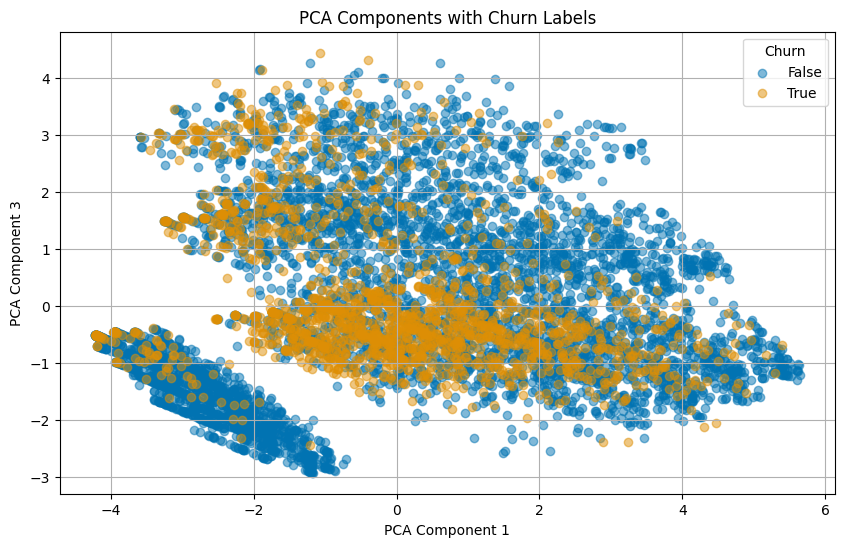

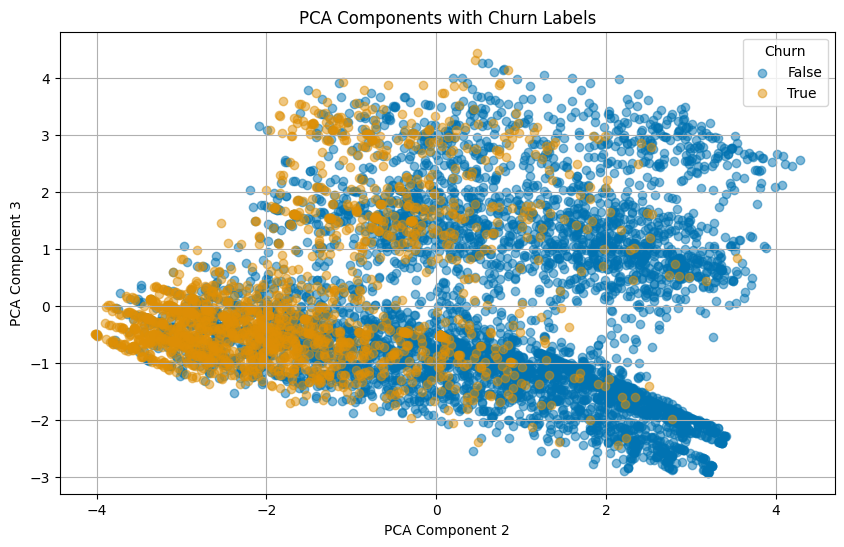

In [35]:
#plot the PCA components with the points colored according to label
plt.figure(figsize=(10, 6))
for i, label in enumerate(unique_labels):
    plt.scatter(X_pca[df_new['Churn'] == label, 0], X_pca[df_new['Churn'] == label, 1], 
                color=colors[i], label=label, alpha=0.5)
plt.title('PCA Components with Churn Labels')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Churn')
plt.grid()
plt.show()
# plot the PCA components with the points colored according to label
plt.figure(figsize=(10, 6))
for i, label in enumerate(unique_labels):
    plt.scatter(X_pca[df_new['Churn'] == label, 0], X_pca[df_new['Churn'] == label, 2], 
                color=colors[i], label=label, alpha=0.5)
plt.title('PCA Components with Churn Labels')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 3')
plt.legend(title='Churn')
plt.grid()
plt.show()
# plot the PCA components with the points colored according to label
plt.figure(figsize=(10, 6))
for i, label in enumerate(unique_labels):
    plt.scatter(X_pca[df_new['Churn'] == label, 1], X_pca[df_new['Churn'] == label, 2], 
                color=colors[i], label=label, alpha=0.5)
plt.title('PCA Components with Churn Labels')
plt.xlabel('PCA Component 2')
plt.ylabel('PCA Component 3')
plt.legend(title='Churn')
plt.grid()
plt.show()

In [44]:
#3d plot of the PCA components with the points colored according to label
#3d plot
import plotly.express as px
# default viasualize in notebook
import plotly.io as pio
pio.renderers.default = 'notebook'
# Create a 3D scatter plot
fig = px.scatter_3d(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    z=X_pca[:, 2],
    color=df_new['Churn'],
    labels={'x': 'PCA Component 1', 'y': 'PCA Component 2', 'z': 'PCA Component 3'},
    title='3D PCA Components with Churn Labels',
)
# Update the layout
fig.update_traces(marker=dict(size=2))
fig.update_layout(
    scene=dict(
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        zaxis_title='PCA Component 3',
    ),
    legend_title_text='Churn'
)
fig.show()

# Save data for further analysis

In [45]:
df_new.to_csv('../dataset/df_encoded.csv', index=False)

In [46]:
df_rescaled.to_csv('../dataset/df_rescaled.csv', index=False)

In [47]:
df_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
df_pca['Churn'] = df_new['Churn'].values

In [48]:
df_pca.to_csv('../dataset/df_pca.csv', index=False)
